In [1]:
%matplotlib notebook
import matplotlib.pyplot as plt
import numpy as np
import cv2
from scipy import optimize
import os

In [2]:
def get_disk(radius):

    r = get_radius_array(radius)
    r[r < radius] = 1
    r[r > radius] = 0
    disk = r.astype(np.bool)

    return disk


def get_radius_array(disk_center, nx, ny):

    x = np.arange(0, nx)
    y = np.arange(0, ny)
    xv, yv = np.meshgrid(x, y)
    radius_array = np.sqrt( (xv - disk_center[0])**2 + (yv - disk_center[1])**2 )

    return radius_array


def fit_bkg(bkg_avg, xmin, xmax, radius_grid, rmin):
    # Define function for calculating a power law
    powerlaw = lambda x, amp, index: amp * (x ** index)
    # define our (line) fitting function
    fitfunc = lambda p, x: p[0] + p[1] * x
    errfunc = lambda p, x, y, err: (y - fitfunc(p, x)) / err

    xdata = np.arange(xmin, xmax, 1)
    ydata = bkg_avg[xdata]
    yerr = 0.2 * ydata
    logx = np.log10(xdata)
    logy = np.log10(ydata)
    logyerr = 0.001 * np.ones(ydata.shape)

    pinit = [1.0, -1.0]
    out = optimize.leastsq(errfunc, pinit,
                           args=(logx, logy, logyerr), full_output=1)
    pfinal = out[0]
    covar = out[1]
    index = pfinal[1]
    amp = 10.0 ** pfinal[0]

    bkg_2d = powerlaw(radius_grid, amp, index)
    bkg_2d[rr <= rmin] = 0

    return bkg_2d, amp, index

In [3]:
files = ['/Users/rattie/Data/Eclipse/Stack_mean_aligned_series/aligned/stack_mean_C_exp250.tiff',
         '/Users/rattie/Data/Eclipse/Stack_mean_aligned_series/aligned/stack_mean_C_exp30.tiff',
         '/Users/rattie/Data/Eclipse/Stack_mean_aligned_series/aligned/stack_mean_C_exp1.tiff']

In [5]:
# Exposure times
times_array = np.array([250, 30, 1])
nexp = len(times_array)

In [6]:
img0 = cv2.imread(files[0], cv2.IMREAD_COLOR + cv2.IMREAD_ANYDEPTH)
nx = img0.shape[1]
ny = img0.shape[0]
# Load all images and convert from openCV BGR to RGB
images = np.zeros([nexp, ny, nx, 3])
for i in range(nexp):
    images[i, :, :, :] = cv2.imread(files[i], cv2.IMREAD_COLOR + cv2.IMREAD_ANYDEPTH)
    images[i, :, :, :] = np.fliplr(images[i,:,:,:].reshape(-1,3)).reshape(images[i,:,:,:].shape)

## Normalization value to work and display in floating points [0 - 1] range.
Use the one from the maximum (brightest) non saturated value: prominence in the red channel. Due to the flat-fielding, we cannot really anticipate what that maximum  would be, which would otherwise be around 16383, maximum value from of a 14-bit detector

<IPython.core.display.Javascript object>


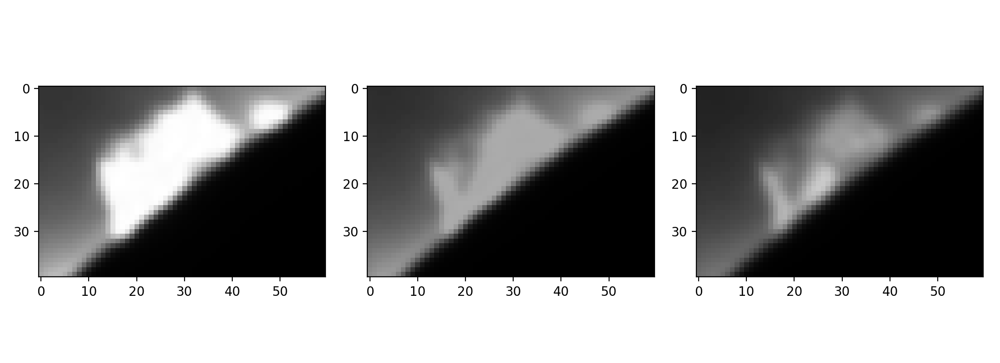

maxval (red channel) = 19574


In [7]:
maxval = images[0, 1080:1120, 1900:1960, 0].max() # ~ 20000
fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(11, 4))
axs[0].imshow(images[0, 1080:1120, 1900:1960, 0], vmin=0, vmax=maxval, cmap='gray')
axs[1].imshow(images[0, 1080:1120, 1900:1960, 1], vmin=0, vmax=maxval, cmap='gray')
axs[2].imshow(images[0, 1080:1120, 1900:1960, 2], vmin=0, vmax=maxval, cmap='gray')
plt.tight_layout()
print('maxval (red channel) = {:0.0f}'.format(maxval))
# Normalize the images to that value
imagesf = images/maxval

### Getting the disk center and radius

<IPython.core.display.Javascript object>


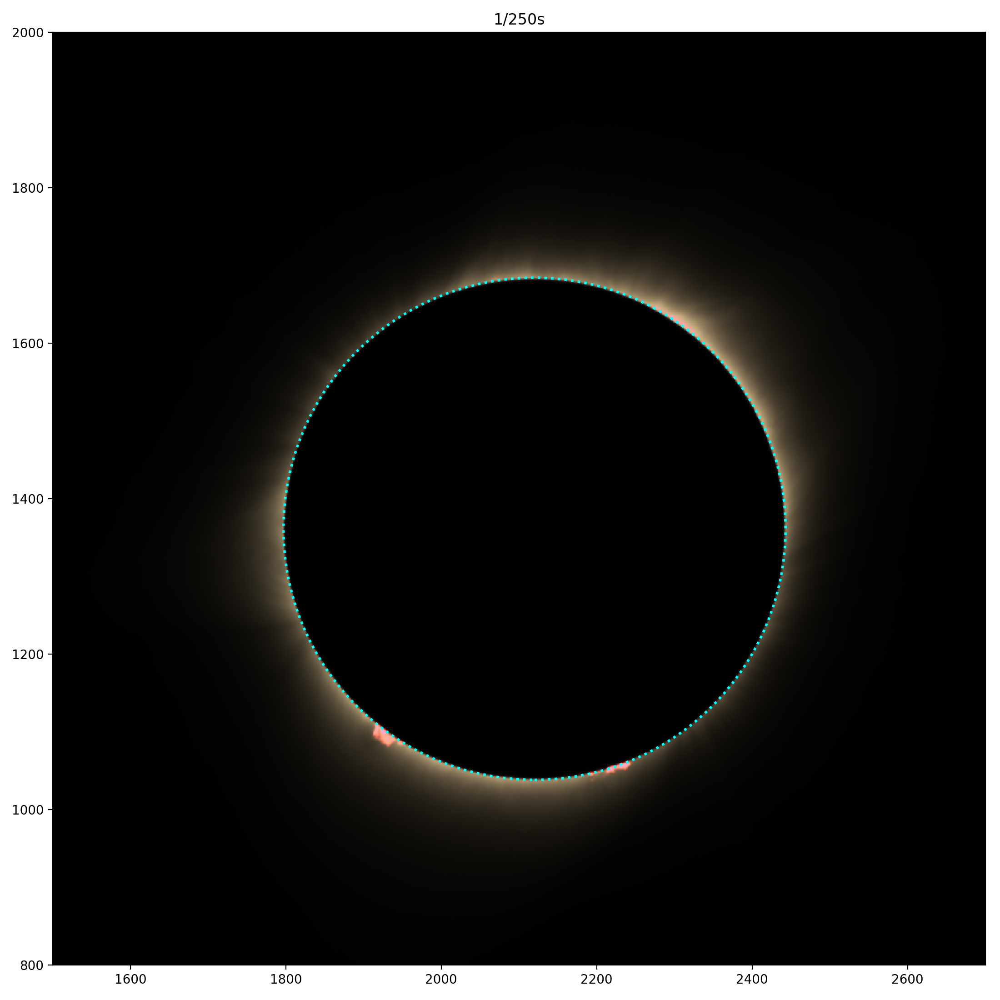

In [9]:
# Coordinate of the center
center = (2120, 1361)
radius = 323
# Plot one image and the circle to check the center and radius
plt.figure(0, figsize=(11,11))
ax1 = plt.gcf().add_subplot(111)
ax1.imshow(np.clip(imagesf[0,...], 0, 1), origin='lower')
ax1.add_artist(plt.Circle(center, radius, color='cyan', ls=':', fill=False, linewidth=2))
ax1.axis([1500, 2700, 800, 2000])
plt.title('1/250s')
plt.tight_layout()

### Normalize to the exposure time => intensity per second

In [10]:
tarray3 = np.reshape(times_array, [nexp, 1, 1, 1])
images_exp = images * tarray3 # * (2**16 -1) / (2**14 -1)
# Divide again to maxval to have a visualization equivalent to "imagesf"
images_expf = images_exp/maxval
# Clip saturated pixels in the exposure-normalized images to the range [0-1] for imshow()
imagesf_clipped = np.clip(imagesf, 0, 1)
images_expf_clipped = np.clip(images_expf, 0, 1)

### Remap to polar

In [11]:
pimages_rgb = np.zeros([nexp, ny, nx, 3])
for exp in range(0,3):
    for ch in range(0,3):
        # Azimuthal average
        pimages_rgb[exp,: , :, ch] = cv2.linearPolar(images_exp[exp, :, :, ch], center, nx, cv2.INTER_LANCZOS4 + cv2.WARP_FILL_OUTLIERS)

# Normalize to maxval
pimages_rgbf = pimages_rgb / maxval


### Get a selection to take the mean or median over the y-axis.

<IPython.core.display.Javascript object>


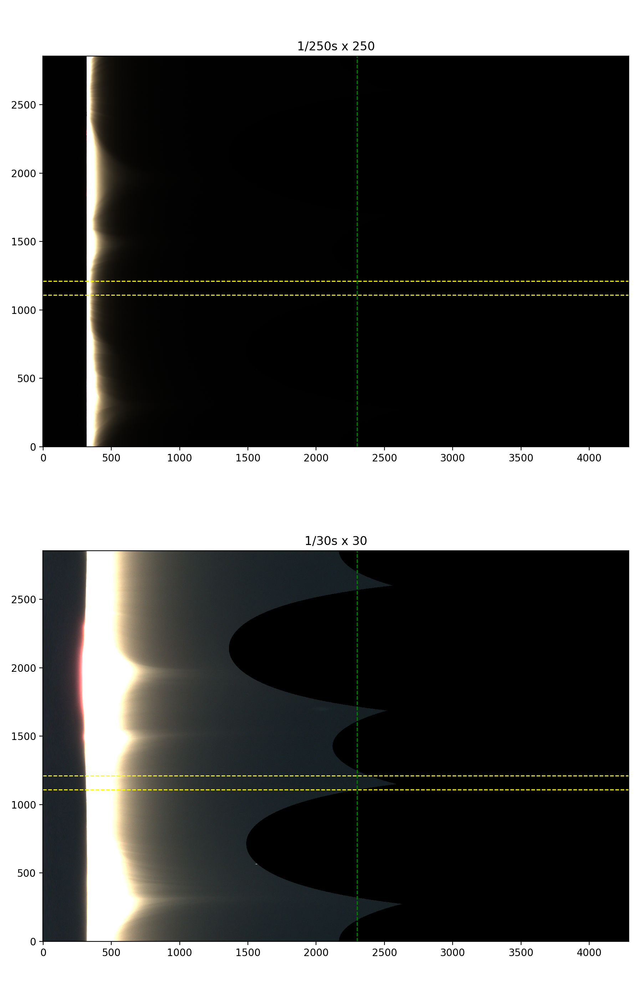

In [12]:
# ymin = 990
# ymax = 1100
ymin = 1110
ymax = 1210

xmax = 2300

fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(9, 14))
axes[0].imshow(np.clip(pimages_rgbf[0,...]/250 * 10, 0, 1), origin='lower')
axes[0].set_title('1/250s x 250')
axes[1].imshow(np.clip(pimages_rgbf[1,...], 0, 1), origin='lower')
axes[1].set_title('1/30s x 30')
# axes[2].imshow(np.clip(pimages_rgbf[2,...], 0, 1), origin='lower')
# axes[2].set_title('1s')

axes[0].axhline(y=ymin, ls='--', linewidth=1, color='yellow')
axes[0].axhline(y=ymax, ls='--', linewidth=1, color='yellow')
axes[0].axvline(x=xmax, ls='--', linewidth=1, color='green')

axes[1].axhline(y=ymin, ls='--', linewidth=1, color='yellow')
axes[1].axhline(y=ymax, ls='--', linewidth=1, color='yellow')
axes[1].axvline(x=xmax, ls='--', linewidth=1, color='green')
# axes[2].axhline(y=ymin, ls='--', linewidth=1, color='yellow')
# axes[2].axhline(y=ymax, ls='--', linewidth=1, color='yellow')
plt.tight_layout()

### Extract and azimuthally average background radial profile

In [13]:
# 1/250s
bkg_az_avg0 = pimages_rgbf[0, ymin:ymax, :, :].mean(axis=0)
# 1/30s
bkg_az_avg1 = pimages_rgbf[1, ymin:ymax, :, :].mean(axis=0)
# 1s
bkg_az_avg2 = pimages_rgbf[2, ymin:ymax, :, :].mean(axis=0)

### Fit that background

In [14]:
rr = get_radius_array(center, nx, ny)
rmin0 = 900
rmax0 = 1400
# 1/250s background fit
# Red
bkg_r0, amp_r0, index_r0 = fit_bkg(bkg_az_avg0[:,0], rmin0, rmax0, rr, radius)
# Green
bkg_g0, amp_g0, index_g0 = fit_bkg(bkg_az_avg0[:,1], rmin0, rmax0, rr, radius)
# Blue
bkg_b0, amp_b0, index_b0 = fit_bkg(bkg_az_avg0[:,2], rmin0, rmax0, rr, radius)

rmin1 = 1000
rmax1 = 1600
# 1/30s background fit
# Red
bkg_r1, amp_r1, index_r1 = fit_bkg(bkg_az_avg1[:,0], rmin1, rmax1, rr, radius)
# Green
bkg_g1, amp_g1, index_g1 = fit_bkg(bkg_az_avg1[:,1], rmin1, rmax1, rr, radius)
# Blue
bkg_b1, amp_b1, index_b1 = fit_bkg(bkg_az_avg1[:,2], rmin1, rmax1, rr, radius)

# 1s background fit
rmin2 = 1000
rmax2 = 1600
# Red
bkg_r2, amp_r2, index_r2 = fit_bkg(bkg_az_avg2[:,0], rmin2, rmax2, rr, radius)
# Green
bkg_g2, amp_g2, index_g2 = fit_bkg(bkg_az_avg2[:,1], rmin2, rmax2, rr, radius)
# Blue
bkg_b2, amp_b2, index_b2 = fit_bkg(bkg_az_avg2[:,2], rmin2, rmax2, rr, radius)

# for plotting, get a longer array of radius values for extrapolating the profile to the center.
xdata2 = np.arange(radius, nx, 1)
powerlaw = lambda x, amp, index: amp * (x ** index)

/Users/rattie/anaconda/envs/MachineLearning/lib/python3.6/site-packages/ipykernel_launcher.py:23: RuntimeWarning: divide by zero encountered in power


<IPython.core.display.Javascript object>


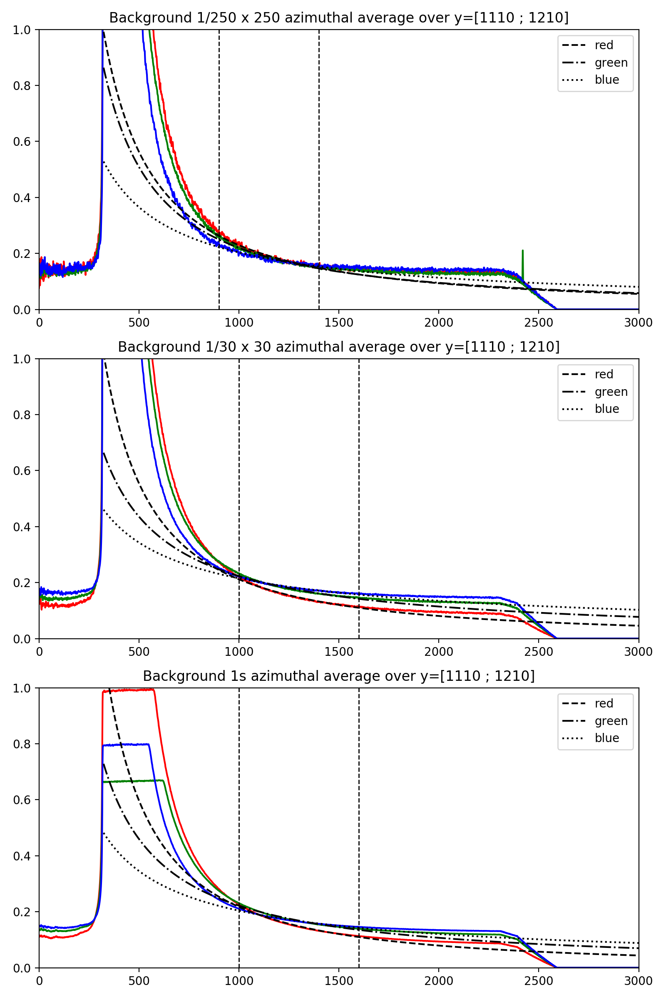

In [15]:
%matplotlib notebook
fig = plt.figure(figsize=(8, 12))
plt.subplot(3,1,1)
plt.plot(bkg_az_avg0[:,0], 'r-')
plt.plot(bkg_az_avg0[:,1], 'g-')
plt.plot(bkg_az_avg0[:,2], 'b-')
plt.plot(xdata2, powerlaw(xdata2, amp_r0, index_r0), 'k--', label='red')
plt.plot(xdata2, powerlaw(xdata2, amp_g0, index_g0), 'k-.', label='green')
plt.plot(xdata2, powerlaw(xdata2, amp_b0, index_b0), 'k:', label='blue')

plt.axvline(x=rmin0, ls='--', linewidth=1, color='black')
plt.axvline(x=rmax0, ls='--', linewidth=1, color='black')
plt.title('Background 1/250 x 250 azimuthal average over y=[{:d} ; {:d}]'.format(ymin, ymax))
plt.legend()
plt.xlim([0, 3000])
plt.ylim([0,1])

plt.subplot(3,1,2)
plt.plot(bkg_az_avg1[:,0], 'r-')
plt.plot(bkg_az_avg1[:,1], 'g-')
plt.plot(bkg_az_avg1[:,2], 'b-')
plt.plot(xdata2, powerlaw(xdata2, amp_r1, index_r1), 'k--', label='red')
plt.plot(xdata2, powerlaw(xdata2, amp_g1, index_g1), 'k-.', label='green')
plt.plot(xdata2, powerlaw(xdata2, amp_b1, index_b1), 'k:', label='blue')

plt.axvline(x=rmin1, ls='--', linewidth=1, color='black')
plt.axvline(x=rmax1, ls='--', linewidth=1, color='black')
plt.title('Background 1/30 x 30 azimuthal average over y=[{:d} ; {:d}]'.format(ymin, ymax))
plt.legend()
plt.xlim([0, 3000])
plt.ylim([0,1])

plt.subplot(3,1,3)
plt.plot(bkg_az_avg2[:,0], 'r-')
plt.plot(bkg_az_avg2[:,1], 'g-')
plt.plot(bkg_az_avg2[:,2], 'b-')
plt.plot(xdata2, powerlaw(xdata2, amp_r2, index_r2), 'k--', label='red')
plt.plot(xdata2, powerlaw(xdata2, amp_g2, index_g2), 'k-.', label='green')
plt.plot(xdata2, powerlaw(xdata2, amp_b2, index_b2), 'k:', label='blue')

plt.axvline(x=rmin2, ls='--', linewidth=1, color='black')
plt.axvline(x=rmax2, ls='--', linewidth=1, color='black')
plt.title('Background 1s azimuthal average over y=[{:d} ; {:d}]'.format(ymin, ymax))
plt.legend()
plt.xlim([0, 3000])
plt.ylim([0,1])

plt.tight_layout()

### Visualize the fitted synthetic background at the exposure normalized from 1/30s, on red, green, blue channels

<IPython.core.display.Javascript object>


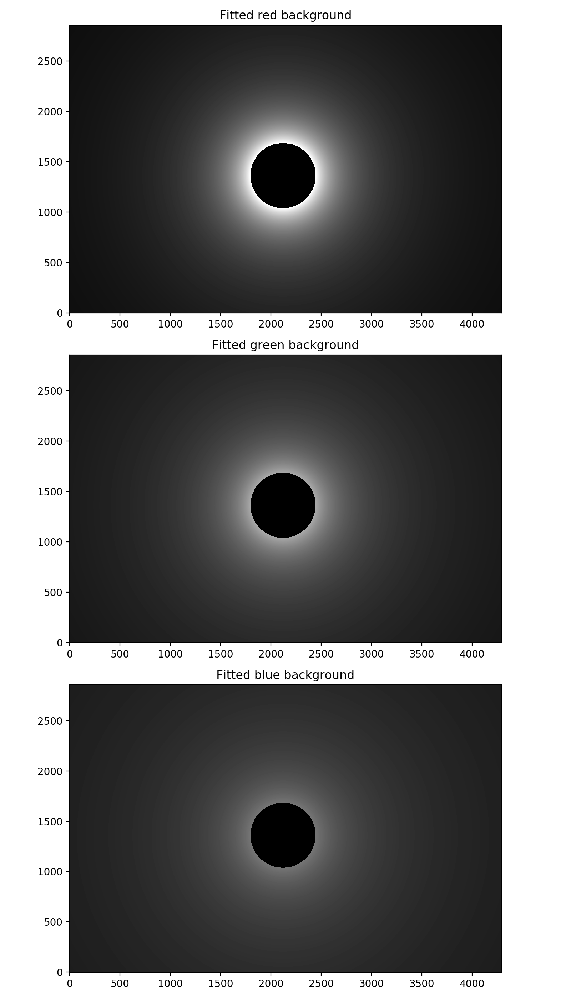

In [16]:
vmin = 0
vmax = 1
fig, axs = plt.subplots(nrows=3, ncols=1, figsize=(8, 14))
# Show fitted background image
axs[0].imshow(bkg_r1, vmin=vmin, vmax=vmax, cmap='gray', origin='lower')
axs[1].imshow(bkg_g1, vmin=vmin, vmax=vmax, cmap='gray', origin='lower')
axs[2].imshow(bkg_b1, vmin=vmin, vmax=vmax, cmap='gray', origin='lower')
axs[0].set_title('Fitted red background')
axs[1].set_title('Fitted green background')
axs[2].set_title('Fitted blue background')
plt.tight_layout()

### Remove background from the images

In [18]:
bkg_stack0 = np.stack([bkg_r0, bkg_g0, bkg_b0], axis=-1)
bkg_stack1 = np.stack([bkg_r1, bkg_g1, bkg_b1], axis=-1)
bkg_stack2 = np.stack([bkg_r2, bkg_g2, bkg_b2], axis=-1)
images_bkg_removed = images_expf.copy()
images_bkg_removed[0, ...] = images_expf[0, ...] - bkg_stack0
images_bkg_removed[1, ...] = images_expf[1, ...] - bkg_stack1
images_bkg_removed[2, ...] = images_expf[2, ...] - bkg_stack2

### Center image around disk center

In [19]:
center_shift = np.array((nx, ny))/2 - center
crop_size = (np.round(center_shift*2)).astype(np.int)
print('center_shift = [{:0.1f}, {:0.1f}]'.format(center_shift[0], center_shift[1]))
print('crop_size = [{:d}, {:d}]'.format(crop_size[0], crop_size[1]))

images_expf2 = images_expf[:, 0:-crop_size[1], 0:-crop_size[0], :].copy()
images_bkg_removed2 = images_bkg_removed[:, 0:-crop_size[1], 0:-crop_size[0], :].copy()
nx = images_bkg_removed2.shape[2]
ny = images_bkg_removed2.shape[1]
center = np.array((nx/2, ny/2), dtype=np.int)

center_shift = [25.0, 67.0]
crop_size = [50, 134]


## Apply filter to brighten the solar corona with a radial power law

In [21]:
rr = get_radius_array(center, nx, ny)
filter_r = (radius/rr)**4
filter_r[rr <= radius] = 1

filter_r2 = filter_r[np.newaxis, :, :, np.newaxis]
filter_r2 = np.repeat(filter_r2, 3, axis=3)
filter_r2 = np.repeat(filter_r2, 3, axis=0)
images_filtered = images_bkg_removed2 / filter_r2

/Users/rattie/anaconda/envs/MachineLearning/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: divide by zero encountered in true_divide
  


In [ ]:
### Build a 

In [22]:
def mirror_patch(im1, im2, x_center):
    im3 = im1.copy()
    im3[:, int(im3.shape[1]/2):im3.shape[1], :] = np.flip(im2[:, 0:int(im2.shape[1]/2), :], axis=1)
    return im3

In [23]:
mirrors = [mirror_patch(images_expf2[i, ...], images_filtered[i, ...], center[0]) for i in range(3)]

<IPython.core.display.Javascript object>


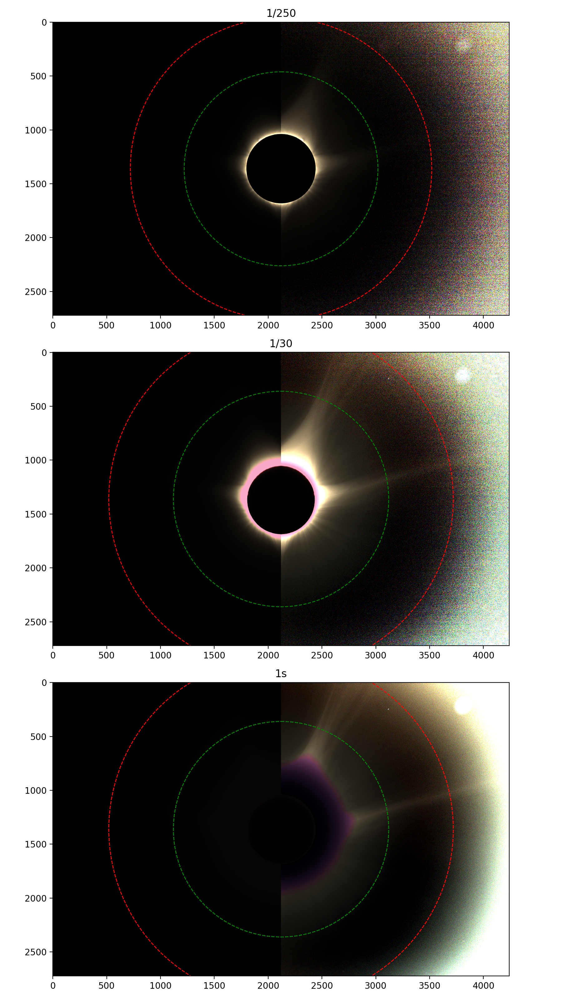

In [24]:
# Display the 3 images in RGB with background removed
%matplotlib notebook
fig, axs = plt.subplots(nrows=3, ncols=1, figsize=(9,16))
axs[0].imshow(np.clip(mirrors[0]/120, 0, 1))
axs[0].add_artist(plt.Circle(center, rmin0, color='g', ls='--', fill = False))
axs[0].add_artist(plt.Circle(center, rmax0, color='r', ls='--', fill = False))
axs[0].set_title('1/250')

axs[1].imshow(np.clip(mirrors[1]/30, 0, 1))
axs[1].add_artist(plt.Circle(center, rmin1, color='g', ls='--', fill = False))
axs[1].add_artist(plt.Circle(center, rmax1, color='r', ls='--', fill = False))
axs[1].set_title('1/30')

axs[2].imshow(np.clip(mirrors[2]/30, 0, 1))
axs[2].add_artist(plt.Circle(center, rmin1, color='gray', ls=':', fill = False))
axs[2].add_artist(plt.Circle(center, rmax1, color='gray', ls=':', fill = False))
axs[2].add_artist(plt.Circle(center, rmin2, color='g', ls='--', fill = False))
axs[2].add_artist(plt.Circle(center, rmax2, color='r', ls='--', fill = False))
axs[2].set_title('1s')

plt.tight_layout()

### Save the images as numpy arrays

In [51]:
savedir = '/Users/rattie/Data/Eclipse/Background_removed/'
fname = os.path.join(savedir, 'images_filtered.npy')
np.save(fname, images_filtered)